# Forelimb Dataset

Below, we replicate the scRNA-seq analysis and do pathway state analysis on the E10.5-E15 day mouse forelimb 10X scRNA-seq dataset published by [He et al.](https://www.nature.com/articles/s41586-020-2536-x) in their paper __"The changing mouse embryo transcriptome at whole tissue and single-cell resolution."__ 

The dataset sequences one pair of forelimbs at stages E10.5, E11.5, E12.5, E13.5, and E15 with the 10X library prep for scRNA-seq. 

<img src="forelimb.png">

We use the Scanpy Python package for analyzing the scRNA-seq data, and we use the Slingshot package to conduct pseudotime analysis. The main steps of our data analysis are quality-control, normalization, global clustering, pseudotime analysis, and pathway state analysis.

## Table of Contents:
* ### [Data Pre-Processing](#1-bullet)
 * #### [Data Before Processing](#2-bullet)
 * #### [Data Normalization](#3-bullet)
 * #### [Highly-Variable Gene Selection](#4-bullet)
 
* ### [Data Visualization and Clustering](#5-bullet)
 * #### [Principal Component Analysis](#6-bullet)
 * #### [Computing the Neighborhood Graph and UMAPs](#7-bullet)
 * #### [Clustering](#8-bullet)
 * #### [Pathway States Snapshot](#9-bullet)
 
* ### [Skin Dataset](#10-bullet)
 * #### [Data Visualization](#11-bullet)
 * #### [Pseudotime Trajectory Analysis [Slingshot R]](#12-bullet)
 * #### [Pathway States Analysis](#14-bullet)
    * #### [Differential Gene Expression Test [DE Single R]](#13-bullet)
* ### [Conclusion](#15-bullet)

In [1]:
import warnings # ignores annoying warnings that pop up during import of packags
warnings.filterwarnings("ignore")

import numpy as np
import scanpy as sc
import scipy as sp
import pandas as pd
import seaborn as sb
from gprofiler import GProfiler

import matplotlib 
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
from matplotlib.axes._axes import _log as matplotlib_axes_logger
import matplotlib.font_manager
matplotlib.rcParams['font.family'] = "calibri"
from matplotlib.figure import Figure
from matplotlib.backend_bases import FigureCanvasBase

import module as md # a module I wrote for the analysis

import panel as pn
pn.extension()

from rpy2.robjects import pandas2ri
import anndata2ri
import rpy2.rinterface_lib.callbacks

import glob

In [2]:
# Here, we adjust parameters and formatting of cells' output.

# We're going to change some of the parameters for warning/error messages in several packages. 
import logging

# This ignores an annoying matplotlib error that comes up with the colors on a plot.
matplotlib_axes_logger.setLevel('ERROR')

# Ignore R warning messages
# Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

# Set on Scanpy's verbose output
sc.settings.verbosity = 3   # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()   # print package settings for Scanpy (replicability)
sc.settings.set_figure_params(dpi=80)

# Set directories for the data, results, and figures. SPECIFY AS APPROPRIATE
resdir = './forelimb/results/'
datadir= './forelimb/data/'

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.7.1 leidenalg==0.7.0


In [3]:
%%R
#library(scran) # single cell RNA-seq analysis
#library(RColorBrewer) # colors for plots
library(slingshot) # Slingshot for pseudotime analysis
#library(gam)
#library(clusterExperiment)
#library(ggplot2) # plotting package
#library(plyr) # plotting package
#library(scales) # plotting package editor
library(DEsingle) # package for differential expression testing
#library(MAST)
#library(scales)

## Data Pre-Processing <a class="anchor" id="1-bullet"></a>

He et al. upload their gene expression matrix as a tsv file, available at https://cells.ucsc.edu/?bp=limb&ds=mouse-limb. 

Their gene expression data is FPKM normalized. This normalization method accounts for relative total counts of genes and their lengths.

We can read this tsv file into Scanpy to create an AnnData object. 

In [4]:
%%time
# We create the AnnData object by uploading the gene expression matrix.
file = datadir+'exprMatrix.tsv' # file that stores the data, a csv for this paper
adata = sc.read_csv(file, delimiter = "\t").T

adata

CPU times: user 6min 41s, sys: 32.7 s, total: 7min 13s
Wall time: 7min 20s


AnnData object with n_obs × n_vars = 90637 × 43346

They also upload a tsv file with metadata of the gene expression matrix, available at https://cells.ucsc.edu/?bp=limb&ds=mouse-limb. We can add these annotations as observations onto our AnnData gene expression matrix.

In [5]:
# The dataset also has a metadata file with annotations of each cell's
# batch number, developmental stage, and cell type. We add these 
# annotations to the AnnData object.

metadata = datadir+'meta.tsv'
df = pd.read_csv(metadata, delimiter = "\t")
df = df.set_index(df['index'])

adata.obs['batch'] = df['batch']
adata.obs['batch'] = [str(i) for i in adata.obs['batch']]
adata.obs['stage'] = df['stage']
adata.obs['cell_type'] = df['cell_type']

df.head()

,index,cell_type,batch,doublet_scores,nCount_RNA,nFeatures_RNA,Percent Mitochond.,stage,UMI Count,doublet_corrected_p,doublet_corrected_p_less_than_0_1
index,,,,,,,,,,,
limb12_13_0AAACCTGAGATCGATA_1,limb12_13_0AAACCTGAGATCGATA_1,Chondrocyte,7,0.216129,11426.0,3404,0.016366,13.0,11428.0,0.000002,1
limb12_13_0AAACCTGAGATGAGAG_1,limb12_13_0AAACCTGAGATGAGAG_1,Mesenchymal 2,7,0.223881,6474.0,2322,0.013284,13.0,6474.0,0.815298,0
limb12_13_0AAACCTGAGCAGATCG_1,limb12_13_0AAACCTGAGCAGATCG_1,Epithelial 1,7,0.014121,8269.0,2162,0.011610,13.0,8273.0,0.896632,0
limb12_13_0AAACCTGAGCGATCCC_1,limb12_13_0AAACCTGAGCGATCCC_1,Fibroblast,7,0.065789,14966.0,3771,0.011092,13.0,14972.0,0.815298,0
limb12_13_0AAACCTGAGTGTACCT_1,limb12_13_0AAACCTGAGTGTACCT_1,Perichondrial,7,0.125270,7649.0,2517,0.018042,13.0,7651.0,0.815298,0


In [6]:
adata

AnnData object with n_obs × n_vars = 90637 × 43346
    obs: 'batch', 'stage', 'cell_type'

We can visualize our dataset to view the quality of our data.

### Data Before Processing <a class="anchor" id="2-bullet"></a>

We can do exploratory data analysis before we actually perform quality control.

normalizing counts per cell
    finished (0:01:05)


... storing 'batch' as categorical
... storing 'cell_type' as categorical
findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.
findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.


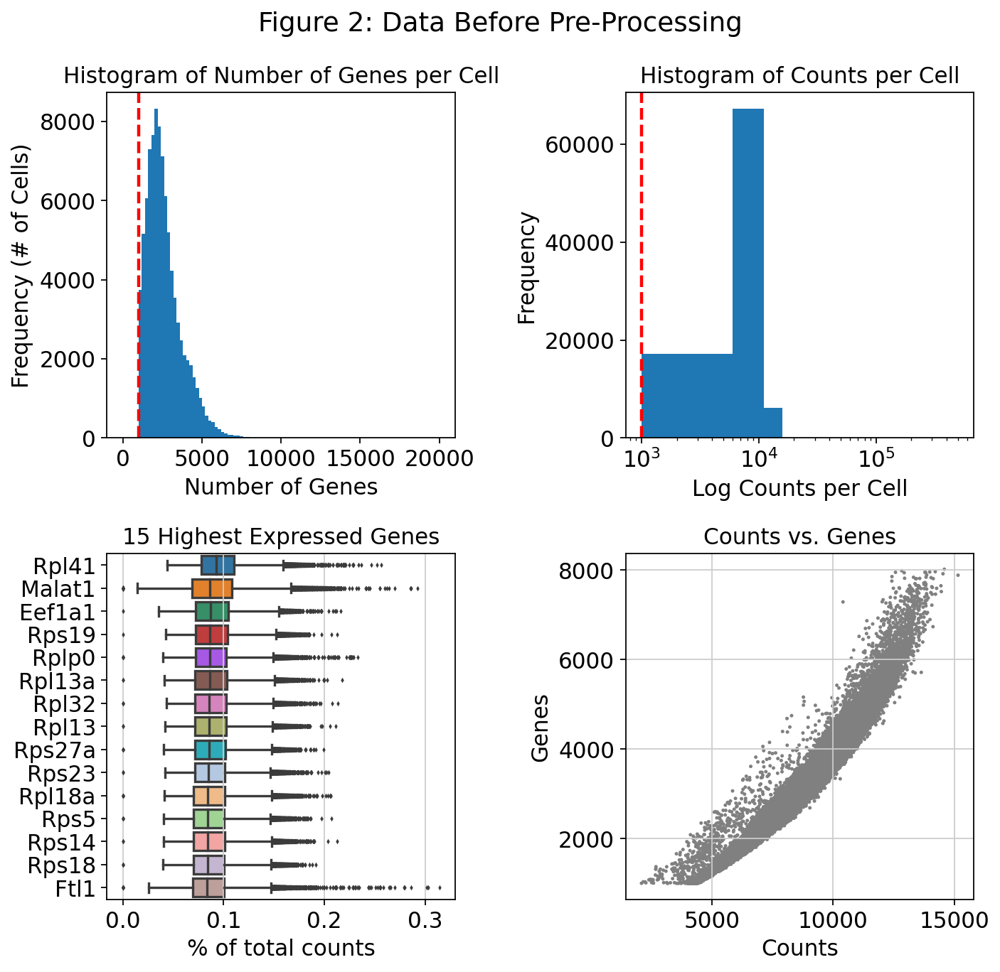

CPU times: user 8min 31s, sys: 4min 45s, total: 13min 17s
Wall time: 14min 19s


In [7]:
%%time

# Below, we display cells with genes/cell and counts/cell, for genes that 
# have at least one 1 count in any cell. 
sc.pp.filter_cells(adata, min_genes=0)
sc.pp.filter_genes(adata, min_cells=0)

# Set annotations to the AnnData object for total counts, cells per gene, and mitochondrial genes
X = np.matrix(adata.X) # this is the gene express matrix from AnnData as a numpy matrix
adata.obs['n_total_counts_per_cell'] = (X.sum(axis=1).A1) # We can sum along the columns to get total counts per cell
adata.var['n_cells_per_gene'] = X.astype(bool).astype(int).sum(axis=0).A1 # Sum along rows to get cells/gene
adata.obs['n_genes_per_cell'] = X.astype(bool).astype(int).sum(axis=1).A1 # Sum along columns to get genes/cell
# A1 operation "flattens" the matrix into a numpy array

# This line of code makes a plot with the different plots on the data prior to processing it for our exploratory analysis.
pre_processed = md.vis_pre_processing(adata, genes_range=(0, 20000),
    counts_range=(1e3, 5e5),title='Figure 2: Data Before Pre-Processing',
                                     genes_threshold = 1000, counts_threshold=1000)

In [8]:
avg_genes = int(np.average(adata.obs['n_genes_per_cell']))
avg_counts = int(np.average(adata.obs['n_total_counts_per_cell']))

print('The average number of genes per cell is ' + str(avg_genes) 
      + ' and the average number of counts per cell is ' 
      + str(avg_counts))

The average number of genes per cell is 2608 and the average number of counts per cell is 7734


The plots above allow us to visualize parameters for our data set, including the number of unique cells and genes captured in the data set, and the distributions of the total number of counts per cell, the total numbers of genes per cell, and the total number of cells per gene.

We can also take a look at the distribution of counts that are from mitochondrial genes in the dataset. 

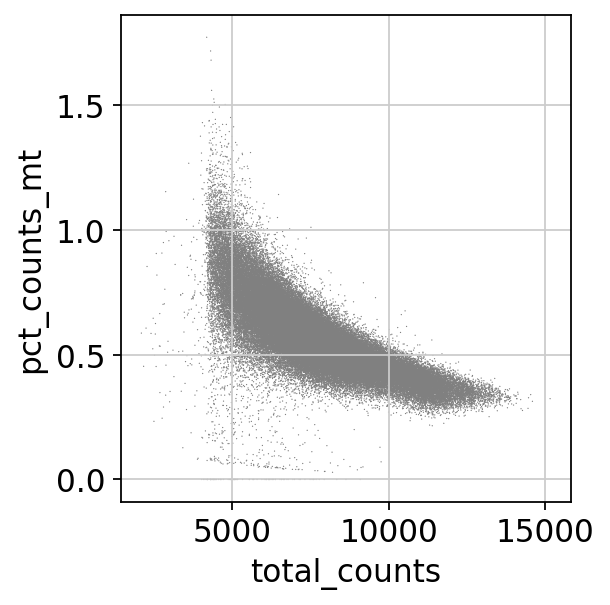

In [9]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')

The authors of the paper use a minimum gene filter of 1,000 genes/cell. We will also use this filter. They have no counts filter (the gene quality control filters out cells with low counts, so a count filter is unnecessary). The authors also use a filter of 8,000 maximum genes/cell and cells with a percent mitochondrial count below 20%. The gene matrix as published already has the cells filtered in accordance with the above standards, so the number of cells does not change.

The authors also apply a filter on genes such that only genes expressed in at least 0.001% of cells (~90 cells) are kept. We apply this filter on genes.

filtered out 25791 genes that are detected in less than 90 cells


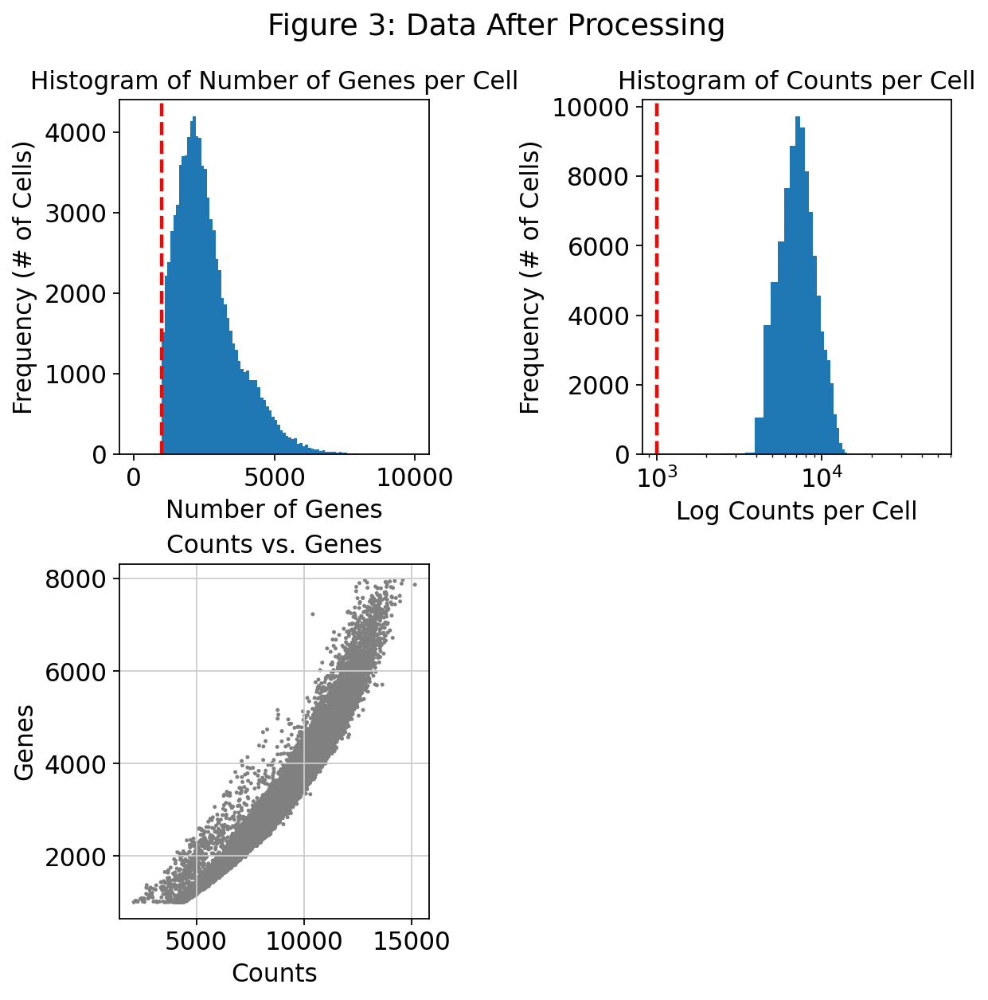

CPU times: user 2min 28s, sys: 2min 37s, total: 5min 6s
Wall time: 5min 37s


In [10]:
%%time

adata = md.filter_data(adata, min_counts=0, min_genes=1000, min_cells=int(adata.shape[0]*0.001))
sc.pp.filter_cells(adata, max_genes = 8000)

post_processing = md.vis_post_processing(adata, genes_range=(0, 10000),
    counts_range=(1e3, 5e4),title='Figure 3: Data After Processing',
                                     genes_threshold = 1000, counts_threshold=1000)

### Data Normalization <a class="anchor" id="3-bullet"></a>

The dataset uses FPKM normalized counts. After this normalization, the authors divide counts per cell by their sum and multiply them by 10,000, add 1, and log-transform the data.

The gene matrix itself contains FPKM normalized counts, and below, we do total count normalization by 10,000, add 1, and log normalize the data.

In [11]:
%%time

# We save a copy of the AnnData object prior to normalization for differential expression testing.
pre_norm = adata.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# We set the raw attribute of our AnnData object as the normalized count matrix. 
adata.raw=adata

normalizing counts per cell
    finished (0:00:02)
CPU times: user 15.5 s, sys: 10.3 s, total: 25.8 s
Wall time: 26.9 s


### Highly-Variable Gene Selection <a class="anchor" id="4-bullet"></a>

We select the top 4,000 highly variable genes. He et. al do something slightly different, by detecting the genes with higest disperson.

Subsequently, we filter out all genes except our highly variable genes, thus only keeping genes that are informative of the heterogeneity of our data. This "dense" matrix is necessary for downstream operations because a larger matrix is more computationally expensive.

In [12]:
%%time

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, n_top_genes=4000)#batch_key = 'batch')#

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:40)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 16.6 s, sys: 21.1 s, total: 37.6 s
Wall time: 40.6 s


Below, we select for genes of interest: Bmp, Wnt, and Notch pathway genes, and marker genes specified in the paper. Note that these genes we select pass our quality-control filters above. Since these genes may not necessarily be highly-variable, we "force" our gene expression matrix to keep our genes of interest for our downstream analysis.

Next, we regress our data on the total number of counts per cell and percentage of counts that are from mitochondrial genes, as He et al. do in their own analysis. We then scale our data set by centering each gene's expression with zero mean and unit variance, and filter out any genes whose standard deviation for expression is greater than 10. 

In [13]:
%%time

# get_genes returns a list of genes that are actually in the filtered data matrix (genes that pass the QC filters)
wnt_ligands = md.get_genes(adata, md.wnts)
wnt_receptors = md.get_genes(adata, md.wntr)
bmp_ligands = md.get_genes(adata, md.bmps)
bmp_receptors = md.get_genes(adata, md.bmpr)
notch = md.get_genes(adata, md.notch)

# Get this from the paper!
markers = ["Gapdh", "Malat1"]

pathways = {'Wnt Ligands': wnt_ligands, 'Wnt Receptors': wnt_receptors, 'BMP Ligands': bmp_ligands,
           'BMP Receptors': bmp_receptors, 'Notch': notch}

all_genes = [wnt_ligands, wnt_receptors, bmp_ligands, bmp_receptors, notch, markers]

adata=md.merge_genes(adata, all_genes)
sc.pp.regress_out(adata, ['n_total_counts_per_cell'])
sc.pp.regress_out(adata, ['pct_counts_mt'])
sc.pp.scale(adata)

regressing out ['n_total_counts_per_cell']
    finished (0:05:05)
regressing out ['pct_counts_mt']
    finished (0:03:09)
CPU times: user 49min 30s, sys: 3min 23s, total: 52min 53s
Wall time: 8min 18s


In [14]:
adata

AnnData object with n_obs × n_vars = 90637 × 4037
    obs: 'batch', 'stage', 'cell_type', 'n_genes', 'n_total_counts_per_cell', 'n_genes_per_cell', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'n_cells', 'n_cells_per_gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p'

He et al. also provide their processed dataset, so we can load that and compare our analysis to theirs.

## Data Visualization and Clustering <a class="anchor" id="5-bullet"></a>

### Principal component analysis <a class="anchor" id="6-bullet"></a>

We perform principal component analysis on the processed data set. This transforms the data to a new linear space and defines a "best-fitting line" for multi-dimensional data. Below, we also plot the variance ratio of the principal components to determine the minimum number of principal components we must select for dimensionality reduction.

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:13)


findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.


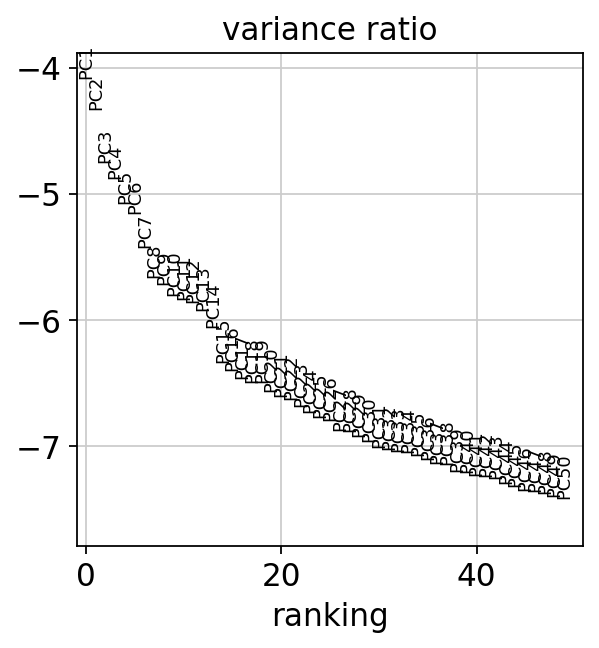

In [15]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)

sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

### Computing the Neighborhood Graph and UMAPs <a class="anchor" id="7-bullet"></a>

We can compute a neighborhood graph of cells using a PCA representation of our data matrix. We can then use UMAPs or the Force Atlas algorithm for dimensionality reduction and visualization. We can appropriately adjust the number of principal components we select based on the above variance ratio plot.

In [16]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=25)

sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:54)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:12)


### Clustering <a class="anchor" id="8-bullet"></a>

We then want to group the cells based on similarity of gene expression. These smaller clusters can inform us of the heterogeneity within the cell types they make up.

In [17]:
sc.tl.leiden(adata, resolution = 4.0) 
# we can increase the value of resolution to increase the number of clusters

running Leiden clustering
    finished: found 64 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:03:42)


findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.
findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.


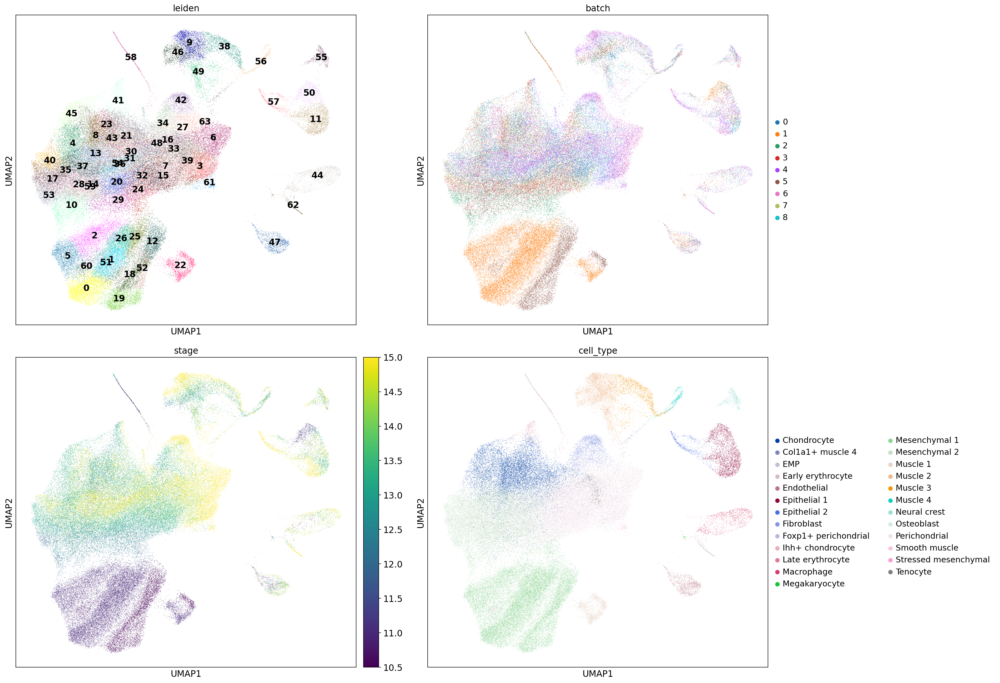

In [18]:
plts = ['leiden', 'batch','stage','cell_type']
fig, axes= plt.subplots(2,2,figsize=(22,15), constrained_layout=True)

for idx, ax in enumerate(axes.flatten()):
    if idx == 0:
        sc.pl.umap(adata, color = plts[idx], ax=ax, show=False, legend_loc = "on data")
    else:
        sc.pl.umap(adata, color = plts[idx], ax=ax, show=False)

### Pathway States Snapshot <a class="anchor" id="9-bullet"></a>

To see whether there indeed are distinct pathway states, we can plot average gene expression across leiden clusters and cell types and do a simple clustering with Seaborn's automatic inputs. 

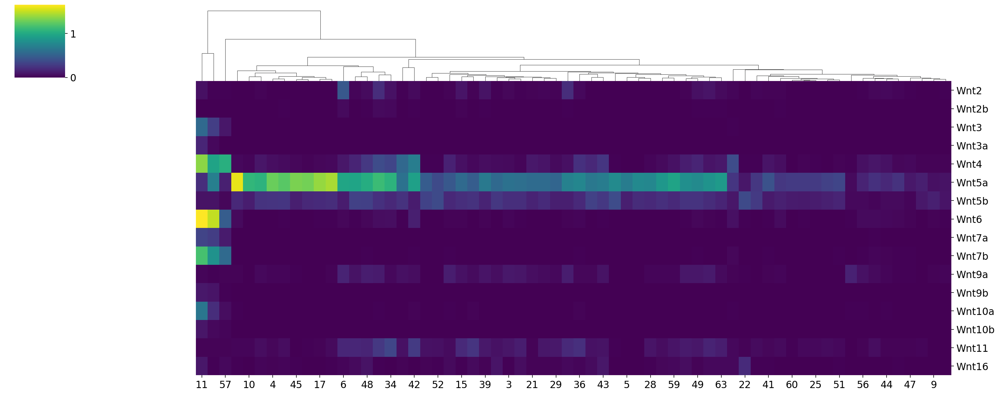

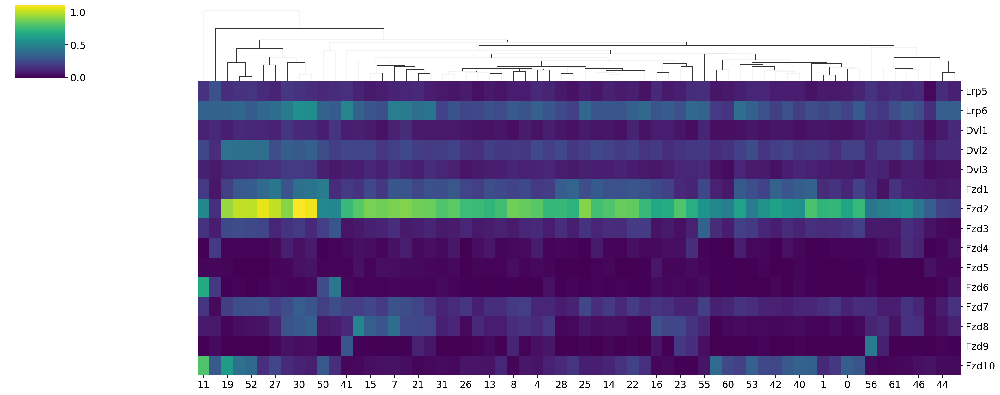

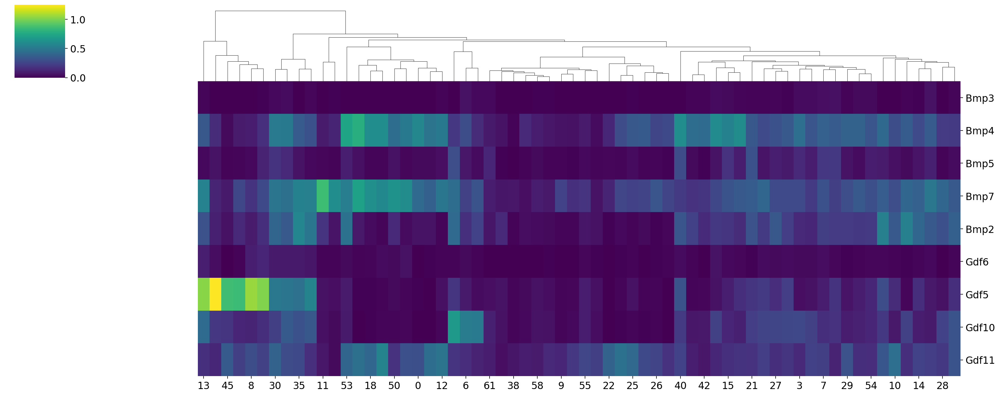

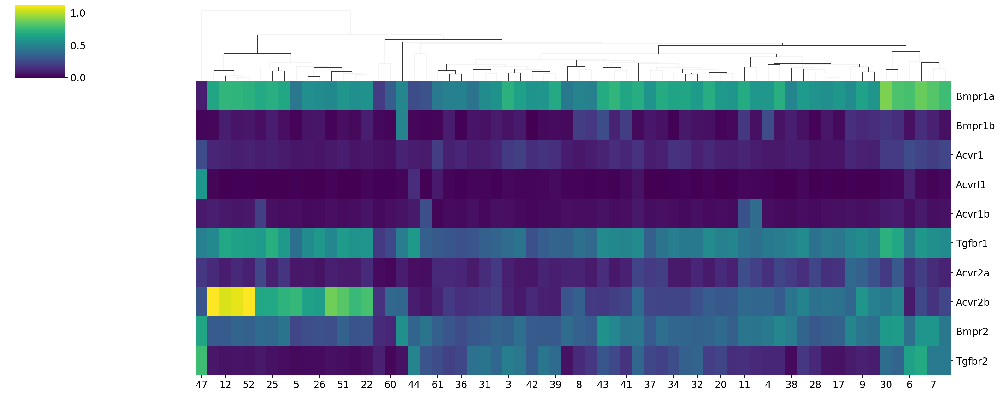

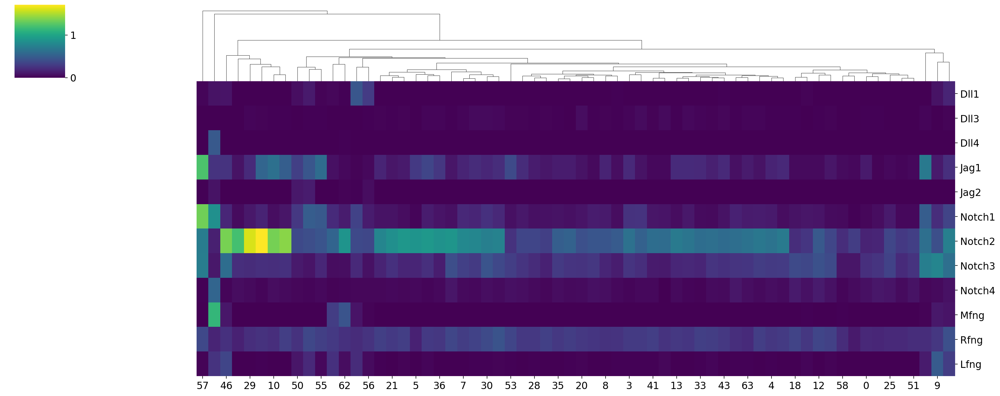

In [19]:
for idx,i in enumerate(list(pathways.keys())):
    # This is a dataframe of average gene expression for a pathway in each leiden cluster.
    df = md.gene_expression_norm(adata,pathways[i])
    
    # Plot heatmap
    g = sb.clustermap(df, cmap='viridis', row_cluster=False, figsize=(20,8))

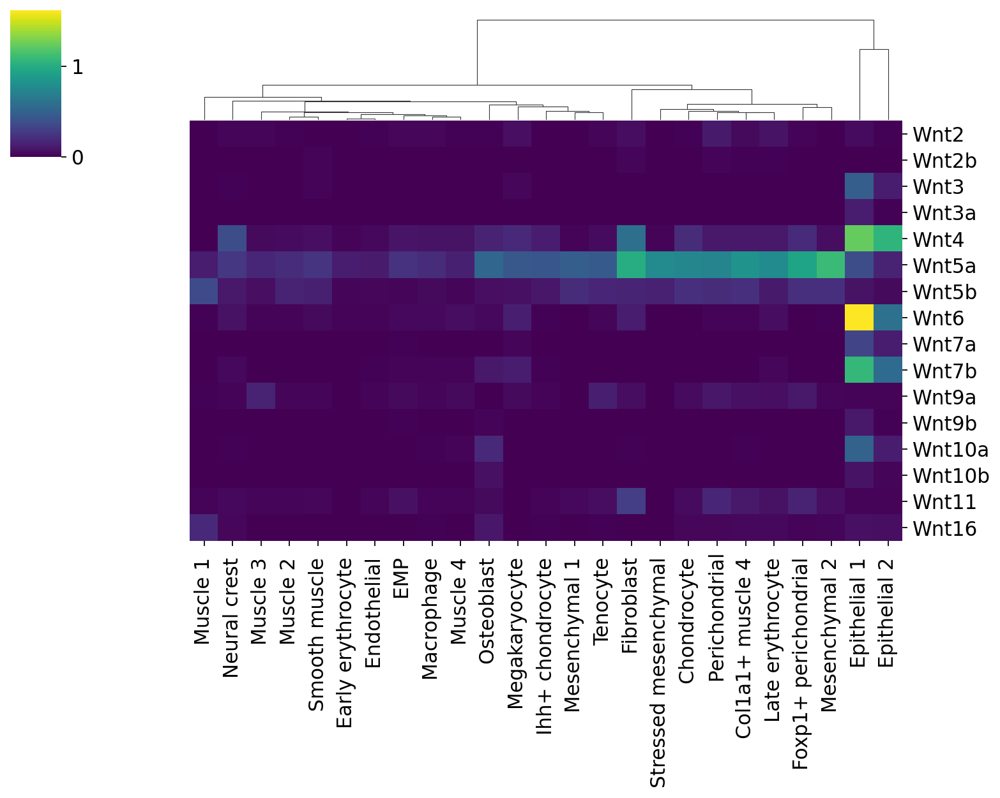

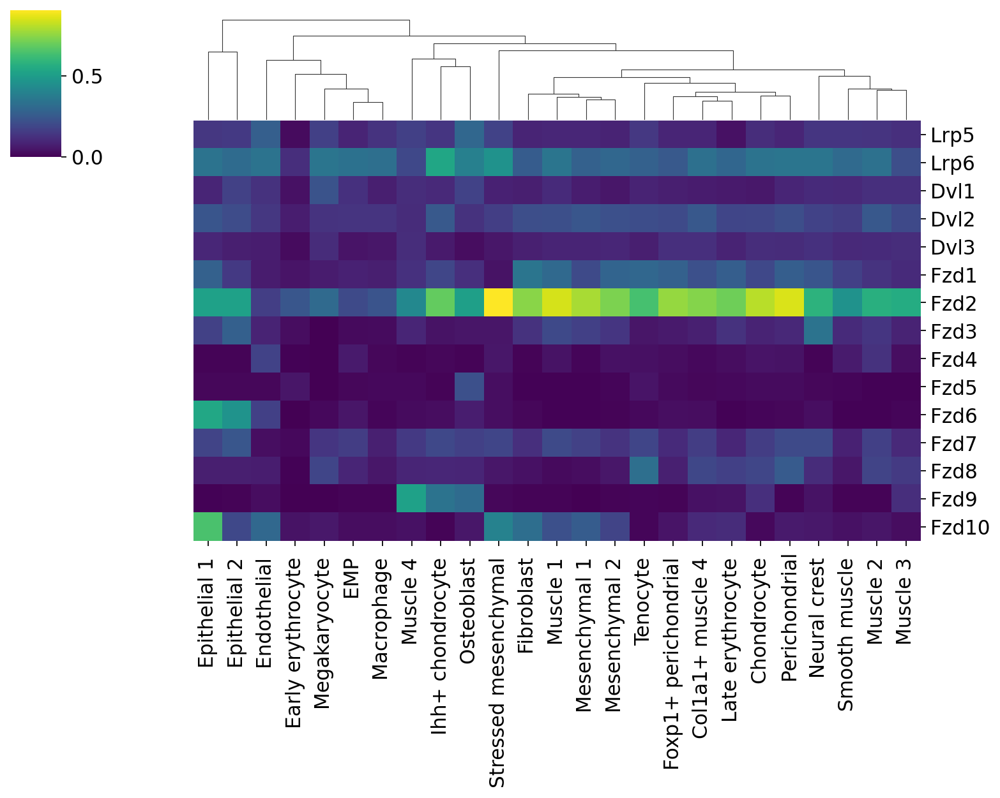

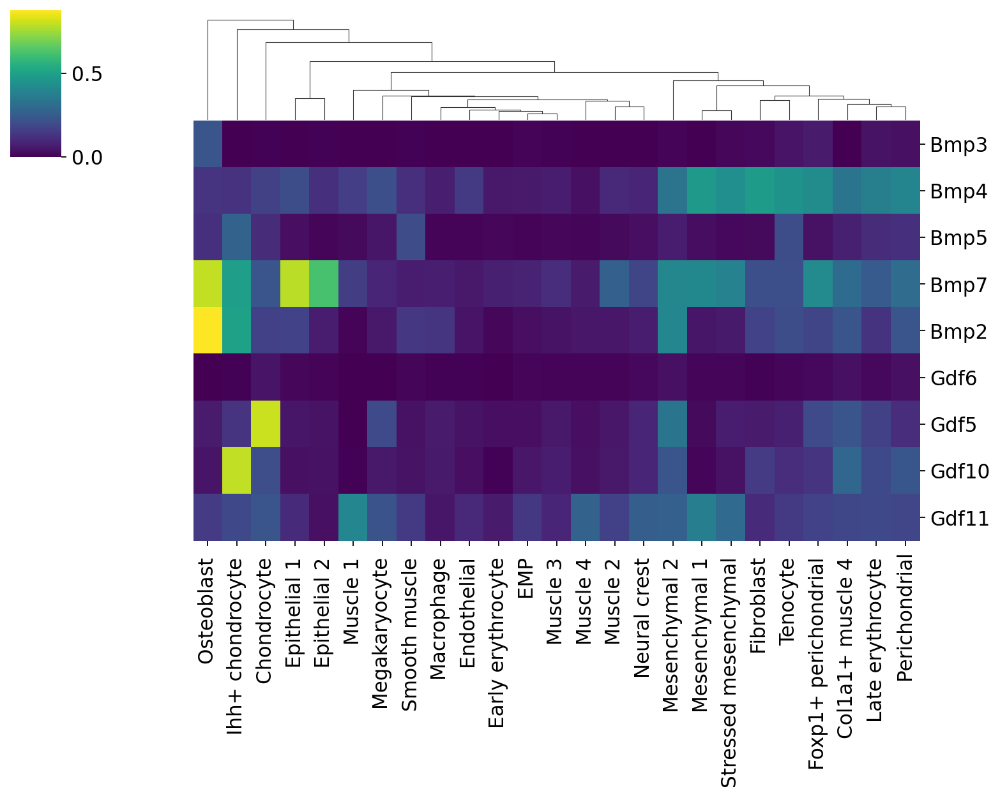

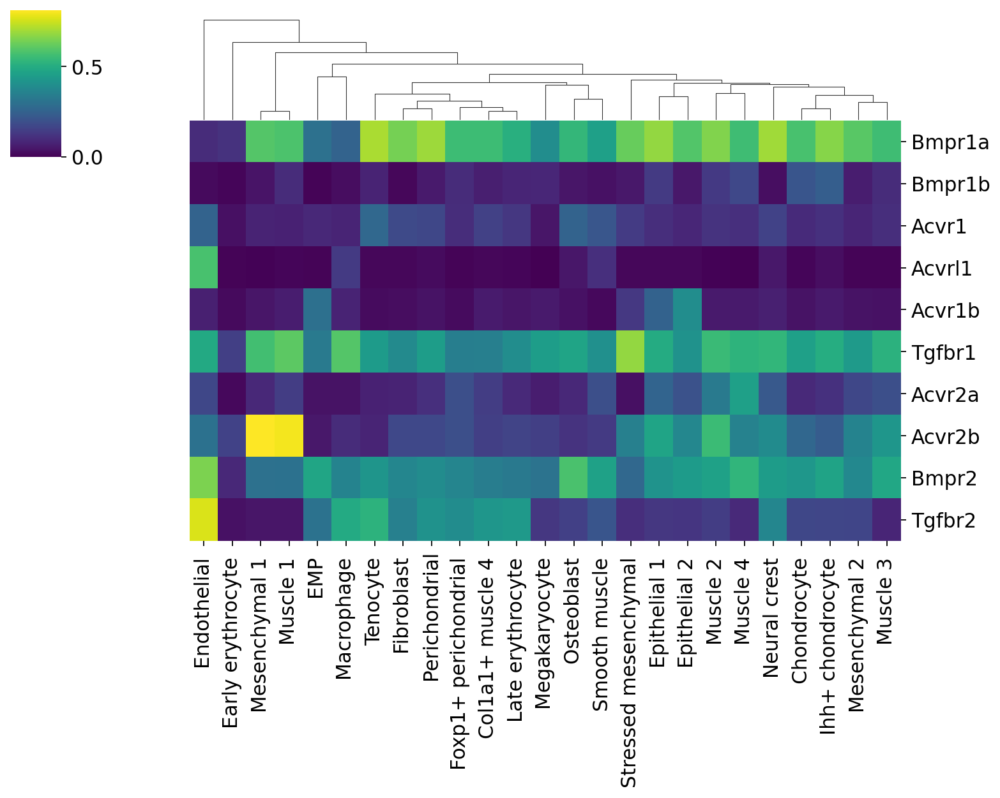

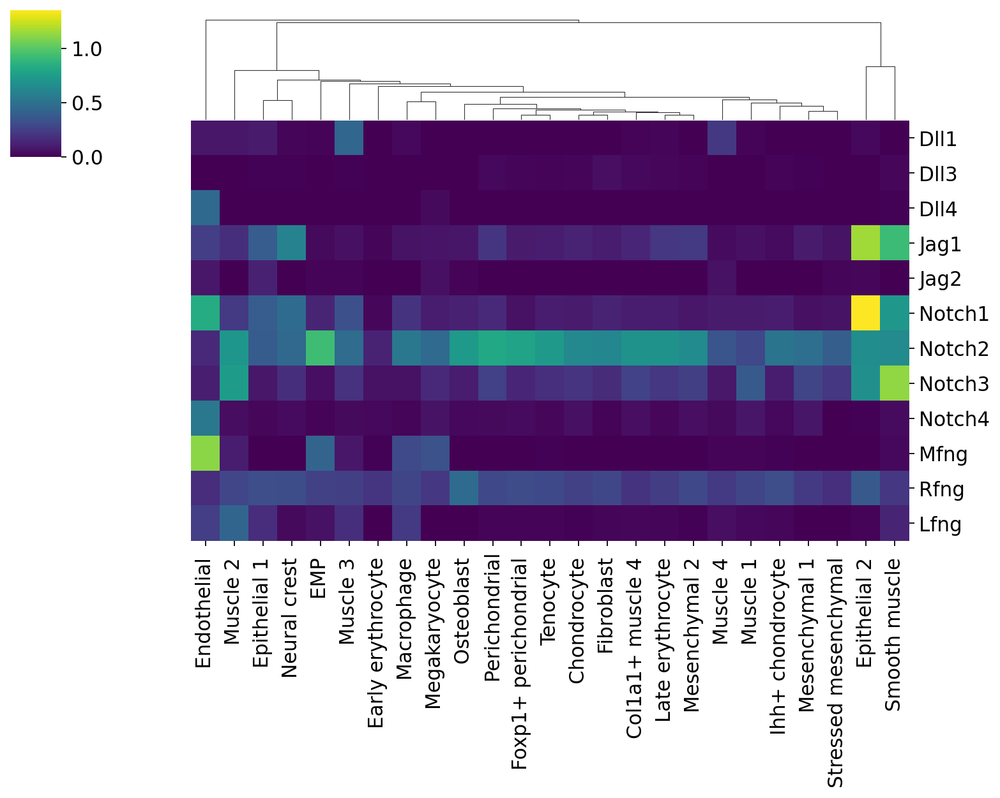

In [20]:
for idx,i in enumerate(list(pathways.keys())):
    # This is a dataframe of average gene expression for a pathway in each cell type.
    df = md.gene_expression_norm(adata,pathways[i], partition_key = "cell_type")

    # Plot heatmap.
    g = sb.clustermap(df, cmap='viridis', row_cluster=False, figsize=(10,8))

## Skin <a class="anchor" id="10-bullet"></a>

Our data show that the epithelial 1 and 2 tissues have particularly high and diverse expression of genes in developmental pathways, so we can explore pathway states in these tissues (which comprise the skin).

In [21]:
# Make a separate AnnData object for the epithelial 1 and 2 tissues. 
skin = adata[adata.obs['cell_type'].isin(["Epithelial 1 ", "Epithelial 2 "])]
skin

View of AnnData object with n_obs × n_vars = 3348 × 4037
    obs: 'batch', 'stage', 'cell_type', 'n_genes', 'n_total_counts_per_cell', 'n_genes_per_cell', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', False
    var: 'n_cells', 'n_cells_per_gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'batch_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

### Data Visualization <a class="anchor" id="11-bullet"></a>

When conducting pseudotime analysis, He et al. compute pseudotime on individual tissues after subsetting them from the whole AnnData object. So, for our dimensionality reduction representation, we can simply use the UMAP coordinates from the whole AnnData object. We can visualize the UMAP of the skin tissues below.

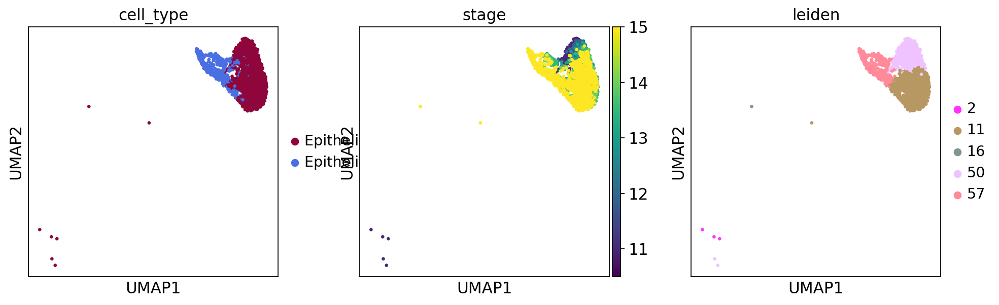

In [22]:
sc.pl.umap(skin, color=["cell_type", "stage", "leiden"])

There are seven extraneous cells away from the main skin tissues cluster. We can filter these out by viewing the numerical values of the UMAP coordinates and filtering out extraneous cells based on these values.

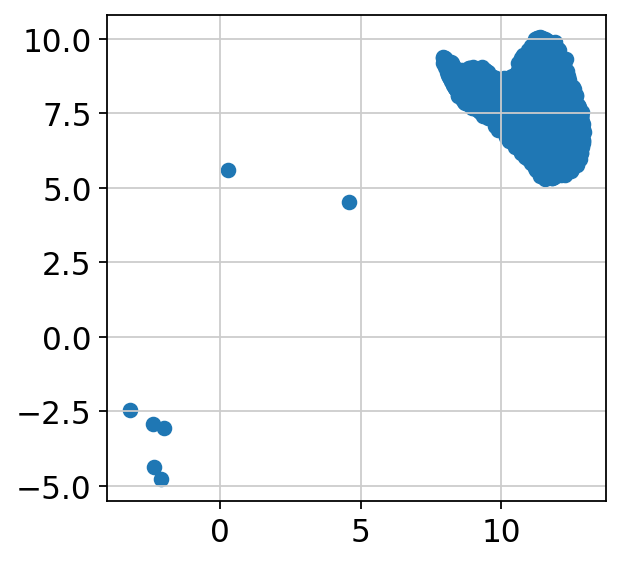

In [23]:
plt.scatter([i[0] for i in skin.obsm["X_umap"]], [i[1] for i in skin.obsm["X_umap"]]);

In [24]:
# Actually filter out extraneous cells.
skin = skin[[i[0]>5 for i in skin.obsm["X_umap"]],:]

We can visualize the skin data again. We can re-cluster our cells with the Leiden algorithm.

running Leiden clustering


Trying to set attribute `.obs` of view, copying.


    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


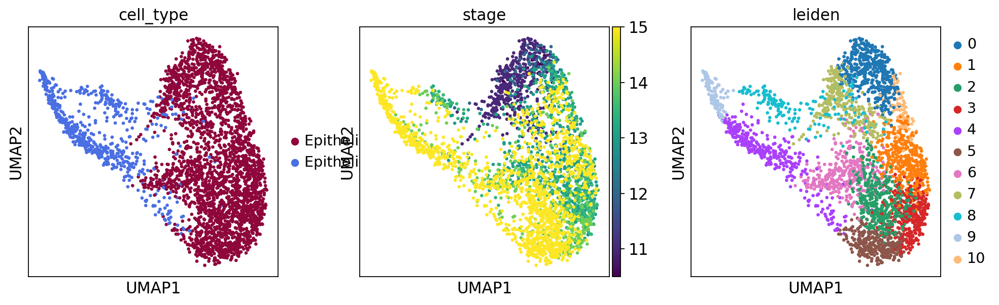

In [25]:
sc.tl.leiden(skin)
# Delete the leiden colors attribute from the AnnData object so we can re-assign colors.
del skin.uns['leiden_colors']

sc.pl.umap(skin, color=["cell_type", "stage", "leiden"])

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:18)


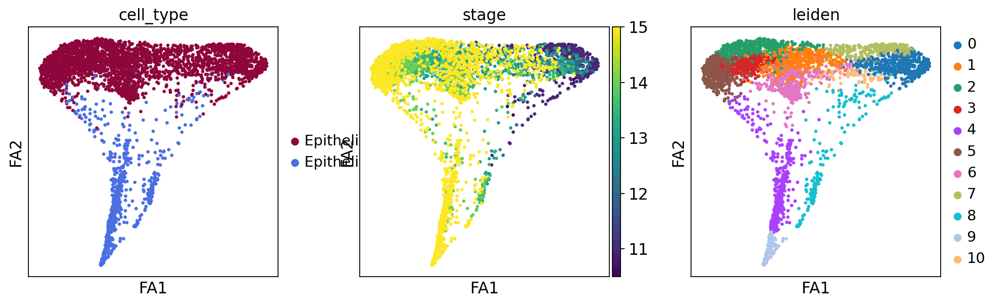

In [26]:
# We can also visualize the skin cells with a different dimensionality reduction, with the
# Force Atlas package.

sc.tl.draw_graph(skin)
sc.pl.draw_graph(skin, color=["cell_type", "stage", "leiden"])

### Pseudotime Trajectory Analysis [Slingshot R] <a class="anchor" id="12-bullet"></a>

Our dimensionality reduction of the skin tissues seems to match that from the publication. We can now do pseudotime analysis on this with Slingshot, a pseudotime analysis package in R. We can pass our AnnData object into R with anndata2ri (which relies on rpy2), which makes the AnnData object a SingleCellExperiment (SCE) object in an R environment.

In [27]:
# anndata2ri for some reason cannot pass the neighbors attribute into the SCE object so 
# we need to delete this attribute. I posted about this and it will be added to the next update.

skin_sce = skin.copy() # make a copy of skin AnnData object

# anndata2ri is pretty buggy right now, so there are some attributes that need to be deleted before we pass
# our AnnData object into R
del skin_sce.uns['neighbors'] # delete the neighbors attribute of the skin AnnData object.
del skin_sce.obs[False] # delete this weird attribute of the AnnData object

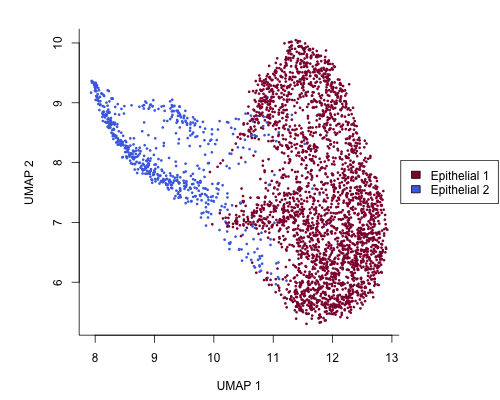

In [28]:
%%R -i skin_sce -w 500 -h 400 

# -i skin_sce passes in the skin_sce AnnData object and converts it to a SingleCellExperiment object
# -w 500 -h 400 sets plot dimensions

# We can plot the UMAP coordinates in R.

par(xpd=TRUE)
par(mar=c(4.5,5.5,2,7))
plot(reducedDims(skin_sce)$UMAP[,1], 
     reducedDims(skin_sce)$UMAP[,2], 
     col=unlist(metadata(skin_sce)$cell_type)[colData(skin_sce)$cell_type], 
     bty='L', xlab='UMAP 1', ylab='UMAP 2', pch=16, cex=0.5)
legend("right", inset=c(-0.31,0), legend=sort(unique(colData(skin_sce)$cell_type)), 
       fill=unlist(metadata(skin_sce)$cell_type_colors))

We can do pseudotime analysis on our skin cells with Slingshot. 

He et al. uses as a root the cluster with the most cells at the earliest stage of development (E10.5), and has three branches whose endpoints are at the latest time point. We can match our leiden clusters on our UMAP to define these root and endpoint clusters. 

In [29]:
%%time
%%R

skin_sling <- slingshot(skin_sce, 
                           clusterLabels = 'leiden', 
                           reducedDim = 'UMAP',
                       start.clus = c("0"), # cluster 0 is the root
                       end.clus = c("8", "5", "9")) # these clusters are the endpoints

print(SlingshotDataSet(skin_sling))

class: SlingshotDataSet 

 Samples Dimensions
    3341          2

lineages: 3 
Lineage1: 0  10  1  3  2  6  4  9  
Lineage2: 0  10  1  3  2  5  
Lineage3: 0  7  8  

curves: 3 
Curve1: Length: 7.9716	Samples: 1738.79
Curve2: Length: 5.1632	Samples: 1843.53
Curve3: Length: 4.7074	Samples: 874.15
CPU times: user 23.5 s, sys: 601 ms, total: 24.1 s
Wall time: 22 s


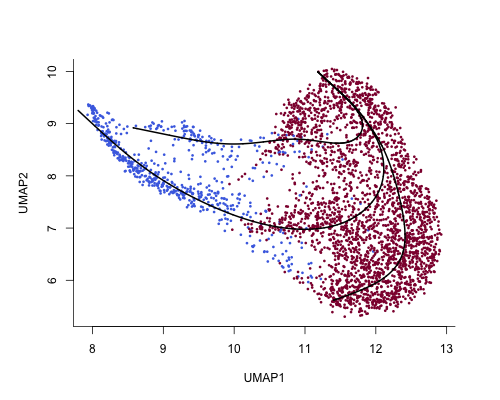

In [30]:
%%R -w 500 -h 400 

# We can plot the Slingshot output below.

par(xpd=TRUE)
par(mar=c(5, 5, 4, 3) + 0.1)
plot(reducedDims(skin_sce)$UMAP[,1], 
     reducedDims(skin_sce)$UMAP[,2], 
     col=unlist(metadata(skin_sce)$cell_type)[colData(skin_sce)$cell_type], 
     bty='L', xlab='UMAP1', ylab='UMAP2', pch=16, cex=0.5)
lines(SlingshotDataSet(skin_sling), lwd=2)

We can see that there are 3 lineages, and they correspond to the lineages published. We can add the pseudotime values and curve coordinates onto the Scanpy skin object to save.

In [31]:
%%R -o pt_df,skin_traj1,skin_traj2,skin_traj3

# We could just pass our skin_sling object as output from our R cell and make it a
# sce object with anndata2ri, but it's nice to have all our annotations on one object.

# We can save the pseudotime values
pt_df <- as.data.frame(slingPseudotime(skin_sling, na=False))

# We can save the curve coordinates of the trajectories
skin_traj <- slingCurves(skin_sling)
skin_traj1 <- skin_traj$curve1$s
skin_traj2 <- skin_traj$curve2$s
skin_traj3 <- skin_traj$curve3$s

In [32]:
# Add the pseudotime values as obs annotations to our scanpy object
skin.obs['slingPseudotime_1'] = pt_df['curve1']
skin.obs['slingPseudotime_2'] = pt_df['curve2']
skin.obs['slingPseudotime_3'] = pt_df['curve3']

# Add the curve coordinates to our scanpy object.
skin.obsm['curve1'] = skin_traj1
skin.obsm['curve2'] = skin_traj2
skin.obsm['curve3'] = skin_traj3

### Pathway States Analysis <a class="anchor" id="14-bullet"></a>

We can now plot the average gene expression for leiden clusters within the skin subset of the forelimb dataset. We can apply a simple cosine metric to cluster this data to check by eye whether there are distinct pathway states in the skin dataset.

In [33]:
ticker = pn.widgets.Select(name='Pathway', options=list(pathways.keys()), width=150)
int_slider = pn.widgets.IntSlider(name='Number of Pathway Clusters', 
                                  start = 2, end=len(skin.obs['leiden'].unique())-1,
                                 width=250)

@pn.depends(ticker.param.value)

def get_silhouette(ticker_val):
    genes = pathways[ticker_val]
    fig = md.silhouette_plots(skin, ticker_val, genes)[0]
    fig.set_size_inches(4,4)
    plt.close()
    return fig

@pn.depends(ticker.param.value, int_slider.param.value)

def get_heatmap(ticker_val, slider_val): 
    genes = pathways[ticker_val]
    g = md.heatmap(skin, genes, slider_val, ticker_val, norm=True, figsize=(6,8))[0]
    plt.close()
    return g

@pn.depends(ticker.param.value, int_slider.param.value)

def get_umap(ticker_val, slider_val):
    fig = Figure()
    fig.set_size_inches(4,4)
    ax = fig.subplots()
    FigureCanvasBase(fig)
    sc.pl.umap(skin, color = ticker_val, ax=ax, show=True, size = 20)#, palette=skin.uns[ticker_val+'_colors'])
    ax.legend()
    ax.set_title(ticker_val)
    return fig

row1 = pn.Column(ticker, int_slider,align='center')
row3 = pn.Column(row1, pn.Spacer(height=10),get_heatmap,align='center')
col1 = pn.Column(get_silhouette, get_umap, align='center')
row2 = pn.Row(col1, row3, align='center')

col=pn.Column(row2, align='center')

panel_layout = pn.Column(pn.pane.Markdown("##Pathway Clusters", align="center", 
                                          style={'font-family': 'Calibri (Body)'}), 
                         pn.pane.Markdown("You can select which patwhay \
                         to analyze, and select an ideal number of clusters based on silhouette scores. \
                         It takes a few seconds for this applet to update, so please be patient after updating \
                        the pathway clickbox or the slider for the cluster number.",
                                          align="center", 
                                          style={'font-family': 'Calibri (Body)'}),
                         col)
panel_layout.app();

findfont: Font family ['calibri'] not found. Falling back to DejaVu Sans.
... storing 'Wnt Ligands' as categorical


The simple cosine clustering indicates there are pathway states, but as we can see from the heatmaps, gene expression data is noisy, and our clusters are not well defined. We can define a different distance metric (we use cosine here) that allows us to more accurately cluster noisy gene expression data. 

### Differential Gene Expression Test [DE Single R] <a class="anchor" id="13-bullet"></a>

We can account for the noise in our gene expression data by performing a differential gene expression test that allows us to determine which genes are significantly differently expressed between two clusters. 

Specifically, we can define a distance metric for our clustering: for n genes expressed in clusters *x* and *y*, the distance is defined as

$$d_{i,j} = \frac{\sum_{i=1}^{n} w_ix_iy_i}{{\sum_{i=1}^{n} x_i^2}{\sum_{i=1}^{n} y_i^2}},$$
where x and y are $n \times 1$ vectors of gene expression, and $w$ is a $n \times 1$ weight vector of differential expression of the n genes between vectors x and y, where
$w_i =
  \begin{cases}
    1 &\text{if } p_i < \alpha\\\\
    0 &\text{otherwise}
  \end{cases}
$

First, we need to do our differential gene expression test for differntially expressed genes between all pairs of Leiden clusters. We use the R package DE Single for this.

Note that DE Single takes as input gene matrix data that has not been normalized, as is convention for DGE testing.

In [34]:
# The pre_norm AnnData object stores our data prior to normalization. We can make a df 
# of the counts for the subset of skin cells.

count_df = pd.DataFrame(pre_norm[skin.obs.index, 
                                     skin.var.index].X,
                       index = skin.obs.index,
                       columns=skin.var.index)

# The SCE class in R stores gene expression data in a matrix where rows are genes and
# columns are cells, so we need to transpose our above df.
count_df = count_df.T

Below is the code for our differential gene expression testing with DE Single. It takes several hours to run. We can run the code directly in our Jupyter notebook, either directly executed in the cell or as a script. We can also open up the script in R on our terminal (which avoids the possibility of JupyterLab crashing). 

In [35]:
%%R -i count_df

# Exporting data for DGE analysis with DESingle
print(dim(count_df))

# Add the count data before the normalization as an annotation to the slingshot output
# SCE object. 
count_mtx <- as.matrix(count_df)
counts(skin_sce) <- count_mtx
logcounts(skin_sce) <- log10(count_mtx+1)

# save the SCE object for the DGE test
saveRDS(skin_sce, file = "./forelimb/results/skin_sce.rds")

[1] 4037 3341


In [ ]:
%%time
%%R

# Option 1: run an R script with the differential gene expression test
# source("./forelimb/results/dge_test.R") # uncomment the code
# Option 0: Best option -- avoids Jupyter Notebook crash -- run the above script in R via commandline.

# Option 2: Run directly into the Jupyter notebook

library(DEsingle)
library(BiocParallel) # for Parallel computing
library(iterators) # to make combinations
library(parallel)

# parallelizes the operations
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers <- parallel::detectCores() - 1
BPPARAM$progressbar <- TRUE

# computes all pairwise combinations of leiden clusters, i.e. n leiden clusters leads to n choose 2 combs.
combos <- combn(unique(colData(skin_sce)[12]$leiden), m=2, simplify=FALSE)

# doing the differential expression test
for (val in seq_along(combos))
{
  cat(val,"out of",length(combos),"\n")
  mtx1 <- count_mtx[,colData(skin_sce)[12]$leiden == combos[[val]][1]] # count matrix for leiden cluster a
  mtx2 <- count_mtx[,colData(skin_sce)[12]$leiden == combos[[val]][2]] # count matrix for leiden cluster b
  group <- factor(c(rep(combos[[val]][1],dim(mtx1)[2]), rep(combos[[val]][2],dim(mtx2)[2]))) # add "group" labels to our 2 count matrices
  fin_mtx <- cbind(mtx1, mtx2) # combine the two gene expression matrices we're comaring
  temp_results <- DEsingle(counts=fin_mtx,group=group, parallel=TRUE, BPPARAM=BPPARAM) # do the test
  write.csv(temp_results, paste0("./results/DE_single_results/",combos[[val]][1],"_",combos[[val]][2], ".csv")) # replace with appropriate results directory
}

We can set a p-value cut-off for significance for our differential expression test results. 

In [36]:
pvalue = 5e-2

In [37]:
# Import the DE Single results
files = glob.glob(resdir+'DE_single_results/*.csv') #format the directories as necessary
prefix_to_drop = resdir+"DE_single_results/"

# We need to format our differential gene expression results
# For each pathway of genes, we can make a upper triangular dataframe that stores the weight matrix w 
# for each pairwise combination of Leiden clusters.

leiden_list = list(skin.obs['leiden'].unique())
leiden_list.sort()

# the dictionary that contains the dataframes for each pathway of genes
pathways_p_vals = dict([(key, pd.DataFrame(object,columns=leiden_list,
                                          index=leiden_list)) for
                       key in list(pathways.keys())])

for file_name in files:
    split_filename1 = file_name.split(prefix_to_drop)
    split_filename2 = split_filename1[1].split("_")
    first_leiden = split_filename2[0]
    second_leiden = split_filename2[1].split(".csv")[0]
    file = pd.read_csv(file_name, index_col=[0])
    count=0
    for gene_list in pathways_p_vals.keys():
        temp = list(file.loc[file.index.isin(pathways[gene_list])][file.loc[file.index.isin(pathways[gene_list])]["pvalue.adj.FDR"] < pvalue]["pvalue.adj.FDR"].index)
        weight_vector = []
        for idx, item in enumerate(pathways[gene_list]):
            if item in temp:
                weight_vector.append(1.0)
            else:
                weight_vector.append(0.0)
        if (int(first_leiden) < int(second_leiden)):
            pathways_p_vals[gene_list].loc[first_leiden][second_leiden] = weight_vector
        else:
            pathways_p_vals[gene_list].loc[second_leiden][first_leiden] = weight_vector

In [38]:
ticker = pn.widgets.Select(name='Pathway', options=list(pathways.keys()), width=150)
int_slider = pn.widgets.IntSlider(name='Number of Pathway Clusters', 
                                  start = 2, end=len(skin.obs['leiden'].unique())-1,
                                 width=250)

@pn.depends(ticker.param.value)

def get_silhouette(ticker_val):
    genes = pathways[ticker_val]
    pval_df = pathways_p_vals[ticker_val]
    fig = md.weighted_silhouette_plot(skin, ticker_val, genes, pval_df)[0]
    fig.set_size_inches(4,4)
    plt.close()
    return fig

@pn.depends(ticker.param.value, int_slider.param.value)

def get_heatmap(ticker_val, slider_val): 
    genes = pathways[ticker_val]
    pval_df = pathways_p_vals[ticker_val]
    g = md.weighted_heatmap(skin, genes, pval_df, slider_val, ticker_val + " " + str(pvalue), norm=True, figsize=(6,8))[0]
    plt.close()
    return g

@pn.depends(ticker.param.value, int_slider.param.value)

def get_umap(ticker_val, slider_val):
    fig = Figure()
    fig.set_size_inches(4,4)
    ax = fig.subplots()
    FigureCanvasBase(fig)
    sc.pl.umap(skin, color = ticker_val, ax=ax, show=True, size = 20)
    ax.legend()
    ax.set_title(ticker_val)
    return fig

row1 = pn.Column(ticker, int_slider,align='center')
row3 = pn.Column(row1, pn.Spacer(height=10),get_heatmap,align='center')
col1 = pn.Column(get_silhouette, get_umap, align='center')
row2 = pn.Row(col1, row3, align='center')

col=pn.Column(row2, align='center')

panel_layout = pn.Column(pn.pane.Markdown("##Pathway Clusters", align="center", 
                                          style={'font-family': 'Calibri (Body)'}), 
                         pn.pane.Markdown("We can apply a simple Cosine metric to just check by eye whether \
                         there are distinct pathway states in the skin dataset. \n You can select which patwhay \
                         to analyze, and select an ideal number of clusters based on silhouette scores. \
                         It takes a few seconds for this applet to update, so please be patient after updating \
                        the pathway clickbox or the slider for the cluster number.",
                                          align="center", 
                                          style={'font-family': 'Calibri (Body)'}),
                         col)
panel_layout.app();

... storing 'Wnt Ligands 0.05' as categorical


## Conclusion <a class="anchor" id="15-bullet"></a>

We can save all our AnnData objects.

In [39]:
# Save the whole forelimb AnnData objects
del adata.obs[False] # weird obs attribute that gets tacked on, cannot save w/o this step
adata.write_h5ad(resdir + "forelimb_adata.h5ad")
pre_norm.write_h5ad(resdir+"pre_norm.h5ad")

# Save the skin AnnData object
del skin.obs[False] # weird obs attribute that gets tacked on, cannot save w/o this step
skin.write_h5ad(resdir+"skin.h5ad")